# OpenEO demonstration for IGARSS 2021 workshop

## Get the R client

In [3]:
if (!"openeo" %in% rownames(installed.packages()))
{
    if (!"remotes" %in% rownames(installed.packages()))
        install.packages("remotes")
    remotes::install_github("Open-EO/openeo-r-client@develop", dependencies=TRUE)
}

library(openeo)

In [4]:
# Also get other libraries we'll be using for the demo
ExtPackages = c("raster", "sf")
for (package in ExtPackages) {
    if (!package %in% rownames(installed.packages()))
        install.packages(package)
    library(package, character.only = TRUE)
}

Loading required package: sp


Attaching package: 'sp'


The following object is masked from 'package:openeo':

    dimensions


Linking to GEOS 3.4.2, GDAL 2.3.2, PROJ 4.8.0



## Create a connection to VITO backend

In [5]:
con = connect("https://openeo-dev.vito.be")

Connected to service:  https://openeo-dev.vito.be/openeo/1.0 
Please check the terms of service (terms_of_service()) and the privacy policy (privacy_policy()). By further usage of this service, you acknowledge and agree to those terms and policies.


You can explore the backend even without logging in:

In [6]:
list_collections()

# A tibble: 44 x 4
   id           title                    description                  deprecated
   <chr>        <chr>                    <chr>                        <chr>     
 1 S1_GRD_SIGM~ Sentinel 1 GRD Sigma0 p~ "Sentinel 1 GRD Sigma0, mos~ NA        
 2 S1_GRD_SIGM~ Sentinel 1 GRD Sigma0 p~ "Sentinel 1 GRD Sigma0, mos~ NA        
 3 TERRASCOPE_~ Sentinel-2 FAPAR L3 V2   "FAPAR Level-3 product at 1~ NA        
 4 TERRASCOPE_~ Sentinel-2 NDVI L3 V2    "NDVI Level-3 product at 10~ NA        
 5 TERRASCOPE_~ Sentinel-2 LAI L3 V2     "Leaf area index Level-3 pr~ NA        
 6 TERRASCOPE_~ Sentinel-2 FCOVER L3 V2  "Fraction of canopy cover L~ NA        
 7 TERRASCOPE_~ Sentinel-2 L2A V2        "[Sentinel-2 Level 2A](http~ NA        
 8 TERRASCOPE_~ Sentinel-1 Coherence     "The Interferometric Cohere~ NA        
 9 PROBAV_L3_S~ PROBA-V S10 TOC 300 m: ~ "PROBA-V S10-TOC \u2013 10-~ NA        
10 PROBAV_L3_S~ PROBA-V S5 TOC 100 m: D~ "PROBA-V S5-TOC \u2013 5-da~ NA        
# ... wit

In [7]:
#collection_viewer()

In [8]:
describe_collection("TERRASCOPE_S2_TOC_V2")

TERRASCOPE_S2_TOC_V2
Title:				Sentinel-2 L2A V2
Description:			[Sentinel-2 Level 2A](https://docs.terrascope.be/#/DataProducts/Sentinel-2/Level2A/Level2A) product, processed from L1C by Sen2Cor. 
 Use the [Terrascope viewer](https://viewer.terrascope.be/?language=nl&bbox=0.9339867511378304,50.14520994379217,6.207424251137831,51.77292299745045&overlay=false&bgLayer=MapBox&date=2019-02-25T03:17:15.000Z&layer=CGS_S2_RADIOMETRY) to explore the data. 

 
Source:				VITO, on behalf of the Belgian Science Policy Office (BELSPO).
Platform:			Sentinel-2A
Platform:			Sentinel-2B
Constellation:			Sentinel-2
Instrument:			MSI
Spatial extent (lon,lat):	(-180, -56), (180, 83)
Temporal extent:		2015-07-06T00:00:00Z / NA
Bands:
                   aliases     common_name gsd    name offset scale  type unit
1              TOC-B01_60M coastal aerosol  60     B01      0 1e-04 int16    1
2              TOC-B02_10M            blue  10     B02      0 1e-04 int16    1
3              TOC-B03_10M           gre

In [9]:
names(list_processes())

[1] "array_apply"                      "arccos"                          
  [3] "arcosh"                           "power"                           
  [5] "last"                             "subtract"                        
  [7] "not"                              "cosh"                            
  [9] "artanh"                           "is_valid"                        
 [11] "first"                            "median"                          
 [13] "eq"                               "absolute"                        
 [15] "arctan2"                          "array_labels"                    
 [17] "divide"                           "is_nan"                          
 [19] "all"                              "round"                           
 [21] "min"                              "any"                             
 [23] "gte"                              "cos"                             
 [25] "between"                          "count"                           
 [27] "xor"                              "extrema"                         
 [29] "and"                              "variance"                        
 [31] "or"                               "sum"                             
 [33] "sin"                              "sinh"                            
 [35] "product"                          "exp"                             
 [37] "neq"                              "sd"                              
 [39] "sort"                             "arsinh"                          
 [41] "int"                              "order"                           
 [43] "array_find"                       "if"                              
 [45] "sqrt"                             "add"                             
 [47] "e"                                "tan"                             
 [49] "mean"                             "array_filter"                    
 [51] "mod"                              "multiply"                        
 [53] "lte"                              "pi"                              
 [55] "ceil"                             "tanh"                            
 [57] "arctan"                           "floor"                           
 [59] "array_element"                    "clip"                            
 [61] "sgn"                              "quantiles"                       
 [63] "arcsin"                           "rearrange"                       
 [65] "array_contains"                   "is_nodata"                       
 [67] "gt"                               "ln"                              
 [69] "log"                              "max"                             
 [71] "lt"                               "load_collection"                 
 [73] "load_disk_data"                   "vector_buffer"                   
 [75] "apply_neighborhood"               "apply_dimension"                 
 [77] "save_result"                      "apply"                           
 [79] "reduce_dimension"                 "add_dimension"                   
 [81] "rename_labels"                    "aggregate_temporal"              
 [83] "aggregate_temporal_period"        "aggregate_spatial"               
 [85] "mask"                             "mask_polygon"                    
 [87] "filter_temporal"                  "filter_bbox"                     
 [89] "filter_spatial"                   "filter_bands"                    
 [91] "apply_kernel"                     "ndvi"                            
 [93] "resample_spatial"                 "resample_cube_spatial"           
 [95] "merge_cubes"                      "run_udf"                         
 [97] "linear_scale_range"               "constant"                        
 [99] "histogram"                        "read_vector"                     
[101] "get_geometries"                   "raster_to_vector"                
[103] "sleep"                            "atmospheric_correction"          
[105] "sar_backscatter"                  "resoluti

## Log in to the backend

You can either log in using OpenID Connect, or using a username and password.

You can use the EGI provider if you want to use a social log in etc., though currently the service is experiencing issues.

In [10]:
# Log in using OpenID connect
names(list_oidc_providers())
# You can use "egi", which allows you to use your institution or
# social login via <https://terrascope.be>
prov = list_oidc_providers()$egi
#login(login_type="oidc", provider=prov, config=list(client_id="vito-default-client", secret=""))

[1] "egi"      "egi-dev"  "keycloak"

In [11]:
# Alternatively, log in with a demo guest account
# Username: igarss, password: igarss123
credentials = read.table("secrets.csv", stringsAsFactors=FALSE)
login(credentials[[1]], credentials[[2]])
rm(credentials)

Login successful.


## Basic handling

Subset and download data: Sentinel-2 RGB

In [12]:
bbox = c("west" = 5.05, "south" = 51.20, "east" = 5.15, "north" = 51.24)
bands = c("B04", "B03", "B02")
dates = c("2021-03-06", "2021-03-07")
out_dir = "."

There are multiple ways to start, but the easiest is to load all data and processes into an object (so we can use tab autocompletion):

In [13]:
p = processes()
cube = p$load_collection("TERRASCOPE_S2_TOC_V2", bands = bands,
                            #spatial_extent = bbox,
                            temporal_extent = dates)
cube = p$filter_bbox(bbox, data=cube)

Warning message in value[[3L]](cond):
"Invalid process description for 'extrema'"


Printing the object gives a symbolic representation of the last step we did:

In [14]:
cube

{
  "process_id": "filter_bbox",
  "arguments": {
    "data": {
      "from_node": "load_collection_UNDRI2976F"
    },
    "extent": {
      "west": 5.05,
      "south": 51.2,
      "east": 5.15,
      "north": 51.24
    }
  }
} 

Download the imagery!

In [15]:
system.time({    
s2basic = compute_result(cube, file.path(out_dir, "basic.tif"))
})

Task result was sucessfully stored.



   user  system elapsed 
  0.042   0.015  11.073 

In [16]:
s2basic

[1] "./basic.tif"

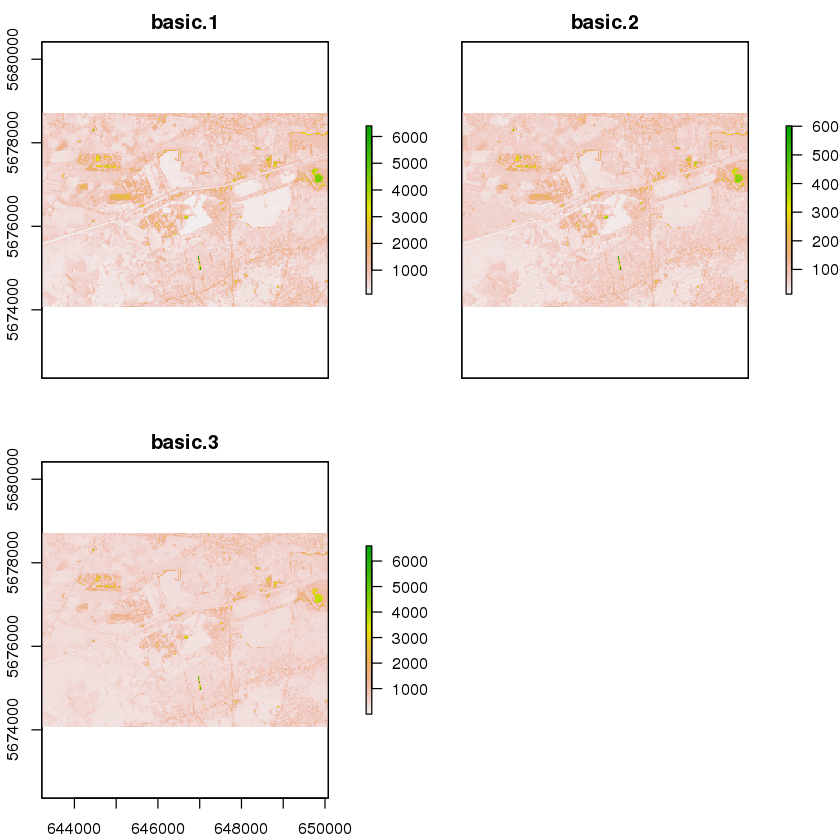

In [17]:
library(raster)
s2basic = brick(s2basic)
plot(s2basic)

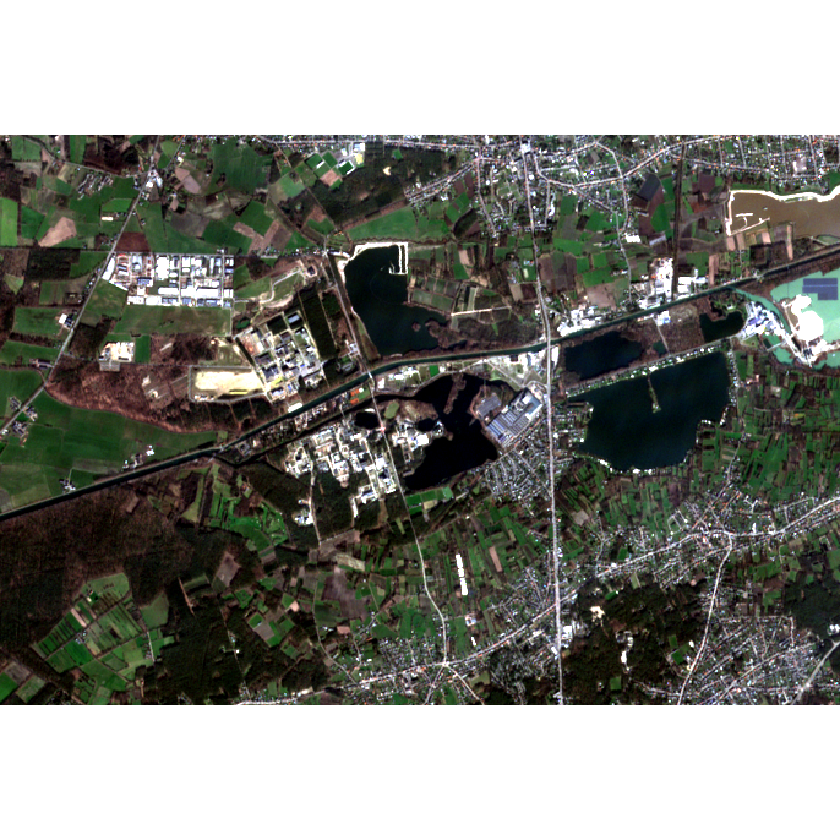

In [18]:
plotRGB(s2basic, stretch="lin")

## Band math: NDVI

Calculate NDVI on the server side.

In [19]:
bands = c("B04", "B08")

cube = p$load_collection("TERRASCOPE_S2_TOC_V2", bands = bands,
                            #spatial_extent = bbox,
                            temporal_extent = dates)
cube = p$filter_bbox(bbox, data=cube)

In [20]:
cube

{
  "process_id": "filter_bbox",
  "arguments": {
    "data": {
      "from_node": "load_collection_QRZDJ9523C"
    },
    "extent": {
      "west": 5.05,
      "south": 51.2,
      "east": 5.15,
      "north": 51.24
    }
  }
} 

Implement the NDVI formula as a function and send it to the backend:

In [21]:
ndvi = p$reduce_dimension(data = cube, dimension = "bands", reducer =
function(data, context) {
  red = data[1]
  nir = data[2]
  ndvi = (nir - red) / (nir + red)
})

If you're interested, you can inspect the JSON-representation of the DataCube we will send to the backend:

In [22]:
as(ndvi, "Graph")

{
  "load_collection_QRZDJ9523C": {
    "process_id": "load_collection",
    "arguments": {
      "id": "TERRASCOPE_S2_TOC_V2",
      "temporal_extent": [
        "2021-03-06",
        "2021-03-07"
      ],
      "bands": [
        "B04",
        "B08"
      ]
    }
  },
  "filter_bbox_ULNOZ4653K": {
    "process_id": "filter_bbox",
    "arguments": {
      "data": {
        "from_node": "load_collection_QRZDJ9523C"
      },
      "extent": {
        "west": 5.05,
        "south": 51.2,
        "east": 5.15,
        "north": 51.24
      }
    }
  },
  "reduce_dimension_TIUNT8292H": {
    "process_id": "reduce_dimension",
    "arguments": {
      "data": {
        "from_node": "filter_bbox_ULNOZ4653K"
      },
      "reducer": {
        "process_graph": {
          "array_element_XHVAN2902X": {
            "process_id": "array_element",
            "arguments": {
              "data": {
                "from_parameter": "data"
              },
              "index": 1,
              "re

Now, execute this data cube on the backend and download the result:

In [23]:
system.time({
ndvifile = compute_result(ndvi, file.path(out_dir, "ndvi.tif"))
})

Task result was sucessfully stored.



   user  system elapsed 
  0.044   0.011  15.719 

In [24]:
ndviraster = raster(ndvifile)

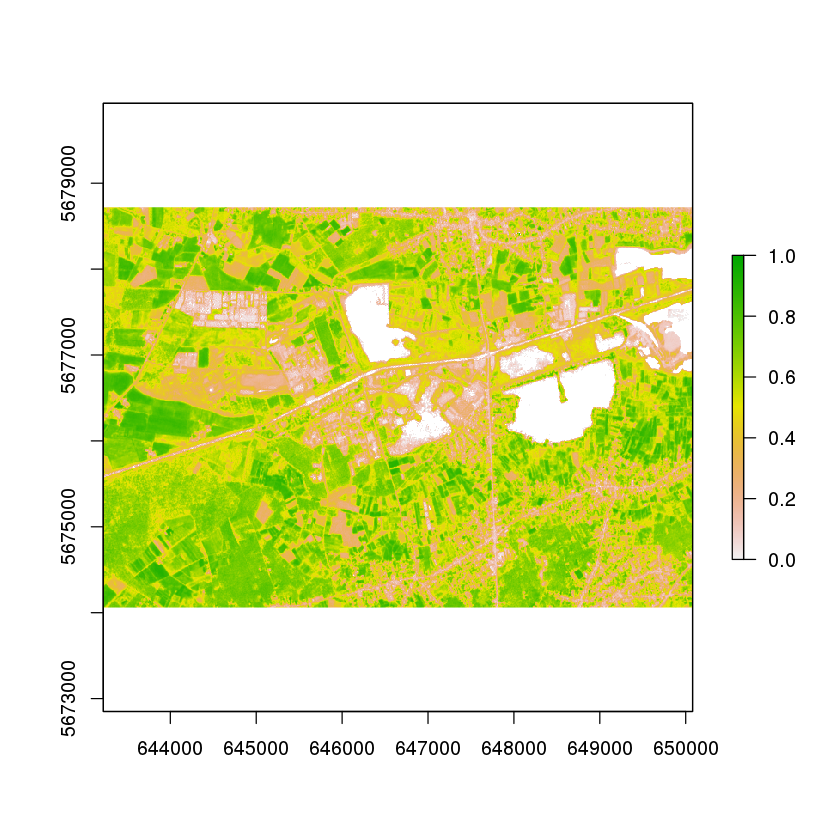

In [25]:
plot(ndviraster, zlim=c(0, 1))

## Cloud filtering

Let's look at a more cloudy area:

In [26]:
dates = c("2020-07-21", "2020-07-22")
bbox = c("west"=5.05, "south"=51.20, "east"=5.15, "north"=51.24)
bands = c("B04", "B03", "B02")

In [27]:
cube = p$load_collection("TERRASCOPE_S2_TOC_V2", bands = bands)
cube = p$filter_bbox(bbox, data=cube)
cube
cube = p$filter_temporal(dates, data=cube)

{
  "process_id": "filter_bbox",
  "arguments": {
    "data": {
      "from_node": "load_collection_EWFSQ8632I"
    },
    "extent": {
      "west": 5.05,
      "south": 51.2,
      "east": 5.15,
      "north": 51.24
    }
  }
} 

In [28]:
outfile = compute_result(cube, file.path(out_dir, "basic-clouded.tif"))

Task result was sucessfully stored.



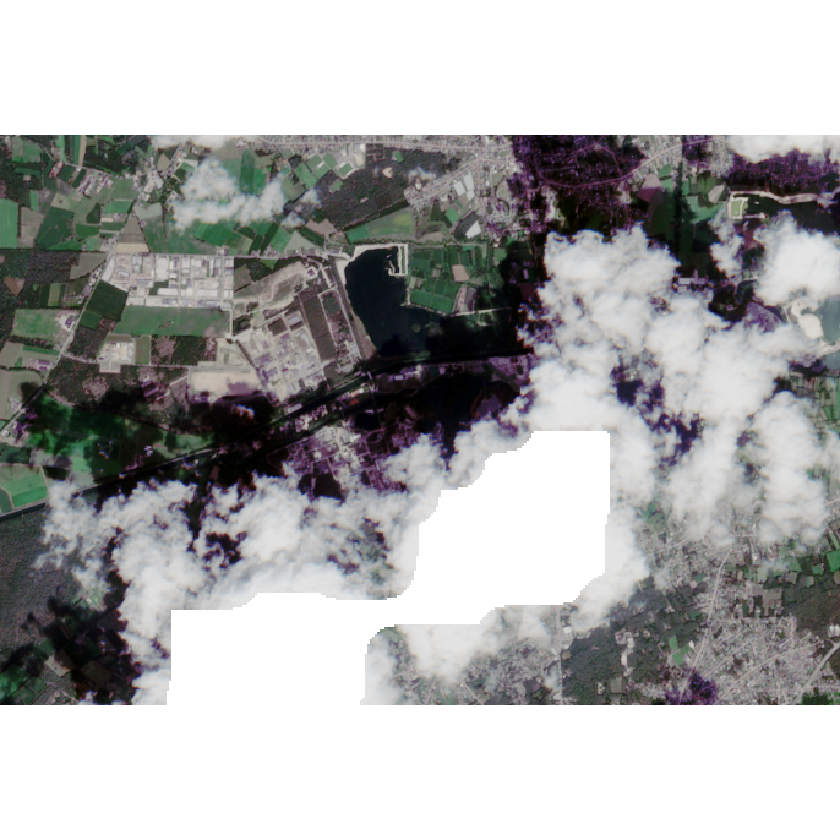

In [29]:
plotRGB(brick(outfile), stretch="hist")

Let's calculate NDVI here and also get the scene classification layer that has cloud information.

In [30]:
bands = c("B04", "B08", "SCL")

cube = p$load_collection("TERRASCOPE_S2_TOC_V2", bands = bands)
cube = p$filter_bbox(bbox, data=cube)
cube
cube = p$filter_temporal(dates, data=cube)

ndvi = p$reduce_dimension(data = cube, dimension = "bands", reducer =
function(data, context) {
  red = data[1]
  nir = data[2]
  ndvi = (nir - red) / (nir + red)
})

outfile = compute_result(ndvi, file.path(out_dir, "ndvi-clouded.tif"))

{
  "process_id": "filter_bbox",
  "arguments": {
    "data": {
      "from_node": "load_collection_ZZJUW4682V"
    },
    "extent": {
      "west": 5.05,
      "south": 51.2,
      "east": 5.15,
      "north": 51.24
    }
  }
} 

Task result was sucessfully stored.



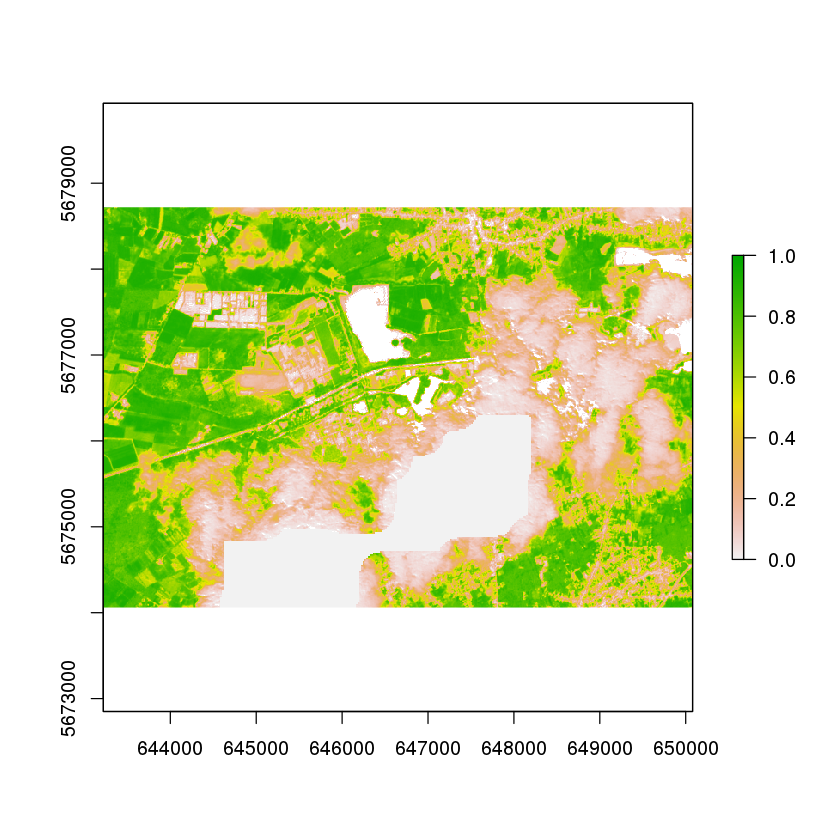

In [31]:
plot(raster(outfile), zlim=c(0, 1))

To filter out the cloudy pixels: let's create a cloud mask based on the scene classification band. 

Build a mask to keep these classes:

4. vegetation
5. (non vegetated)

and remove the rest (clouds, cloud shadows, water, snow, ...)


In [32]:
classification = p$filter_bands("SCL", data=cube)

In [33]:
mask = p$apply(data = classification, process =
  function(value, context){
      classification = value
      result = p$or((classification == 4), (classification == 5))
  }
)

In [34]:
outfile = compute_result(mask, file.path(out_dir, "mask-orig.tif"))

Task result was sucessfully stored.



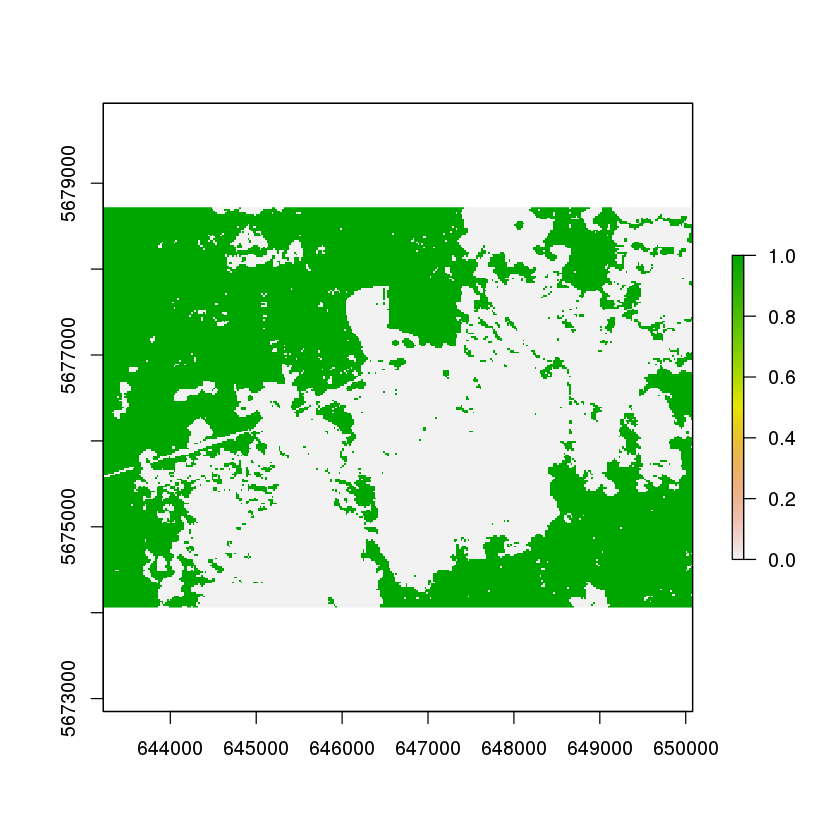

In [35]:
plot(raster(outfile))

The green parts of this image are the pixels that were classified as class 4 or 5, and the other (white) pixels are the pixels we want to discard (replace with `NA` = not available).

We would also like to avoid haze on cloud edges. We better expand the green area a bit to be a bit more conservative about which pixels are the usable ones. We can implement this "dilation" by applying a gaussian blur and threshold operation.

In [36]:
kernel = focalWeight(raster(ncols=100, nrows=100, xmn=0), 3, "Gauss")

The kernel is simply a `matrix` of weights.

In [37]:
kernel

7.082330e-06,3.578765e-05,0.0001261666,0.0003103197,0.0005325106,0.000637531,0.0005325106,0.0003103197,0.0001261666,3.578765e-05,7.082330e-06
3.578765e-05,1.808382e-04,0.0006375310,0.0015680732,0.0026908244,0.003221502,0.0026908244,0.0015680732,0.0006375310,1.808382e-04,3.578765e-05
1.261666e-04,6.375310e-04,0.0022475655,0.0055281190,0.0094862902,0.011357151,0.0094862902,0.0055281190,0.0022475655,6.375310e-04,1.261666e-04
3.103197e-04,1.568073e-03,0.0055281190,0.0135969787,0.0233325088,0.027934085,0.0233325088,0.0135969787,0.0055281190,1.568073e-03,3.103197e-04
5.325106e-04,2.690824e-03,0.0094862902,0.0233325088,0.0400387453,0.047935081,0.0400387453,0.0233325088,0.0094862902,2.690824e-03,5.325106e-04
6.375310e-04,3.221502e-03,0.0113571513,0.0279340847,0.0479350810,0.057388711,0.0479350810,0.0279340847,0.0113571513,3.221502e-03,6.375310e-04
5.325106e-04,2.690824e-03,0.0094862902,0.0233325088,0.0400387453,0.047935081,0.0400387453,0.0233325088,0.0094862902,2.690824e-03,5.325106e-04
3.103197e-04,1.568073e-03,0.0055281190,0.0135969787,0.0233325088,0.027934085,0.0233325088,0.0135969787,0.0055281190,1.568073e-03,3.103197e-04
1.261666e-04,6.375310e-04,0.0022475655,0.0055281190,0.0094862902,0.011357151,0.0094862902,0.0055281190,0.0022475655,6.375310e-04,1.261666e-04
3.578765e-05,1.808382e-04,0.0006375310,0.0015680732,0.0026908244,0.003221502,0.0026908244,0.0015680732,0.0006375310,1.808382e-04,3.578765e-05
7.082330e-06,3.578765e-05,0.0001261666,0.0003103197,0.0005325106,0.000637531,0.0005325106,0.0003103197,0.0001261666,3.578765e-05,7.082330e-06


Next, we apply the matrix in a moving window to get a raster of 0-1 values. We want to filter out all pixels that are below 0.9, i.e. those closer to 0.

In [38]:
mask2 = p$apply_kernel(kernel, data=mask)
mask2 = p$reduce_dimension(mask2, function(x, context) x < 0.9, "bands")

In [39]:
mask2

{
  "process_id": "reduce_dimension",
  "arguments": {
    "data": {
      "from_node": "apply_kernel_PADYX7102J"
    },
    "reducer": {
      "process_graph": {
        "lt_UZISN6554U": {
          "process_id": "lt",
          "arguments": {
            "x": {
              "from_parameter": "data"
            },
            "y": 0.9
          },
          "result": true
        }
      }
    },
    "dimension": "bands",
    "context": null
  }
} 

In [40]:
outfile = compute_result(mask2, file.path(out_dir, "mask.tif"))

Task result was sucessfully stored.



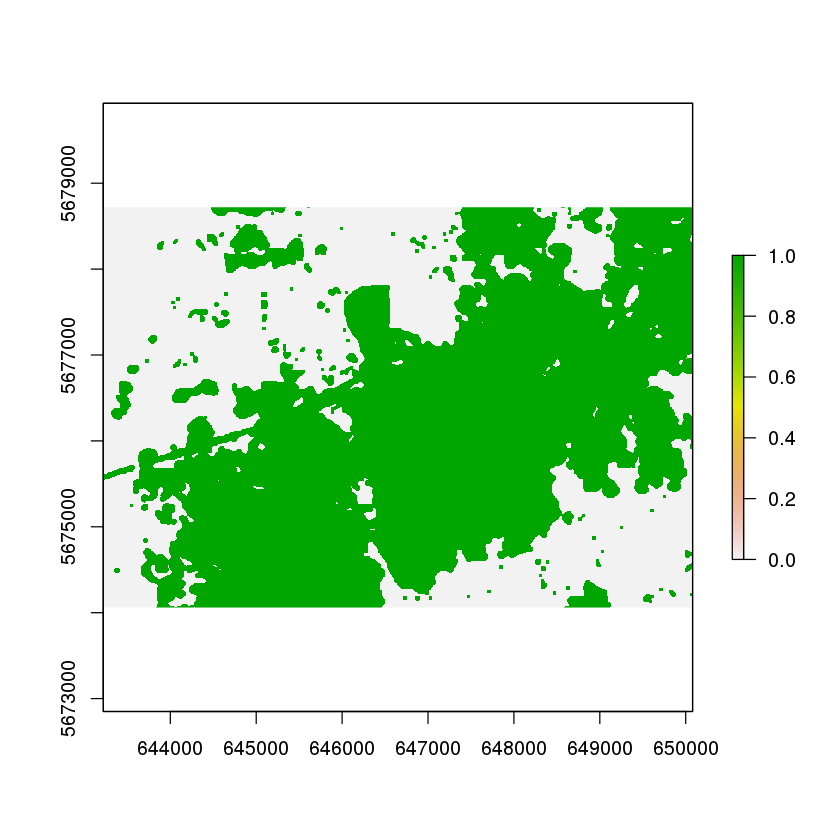

In [41]:
plot(raster(outfile))

The mask is inverted, since in OpenEO we treat masking as "mask out the pixels indicated by 1".

Now that we have the mask, let's apply it to the NDVI layer!

In [42]:
masked_ndvi = p$mask(ndvi, mask2)

In [43]:
outfile = compute_result(masked_ndvi, file.path(out_dir, "ndvi-masked.tif"))

Task result was sucessfully stored.



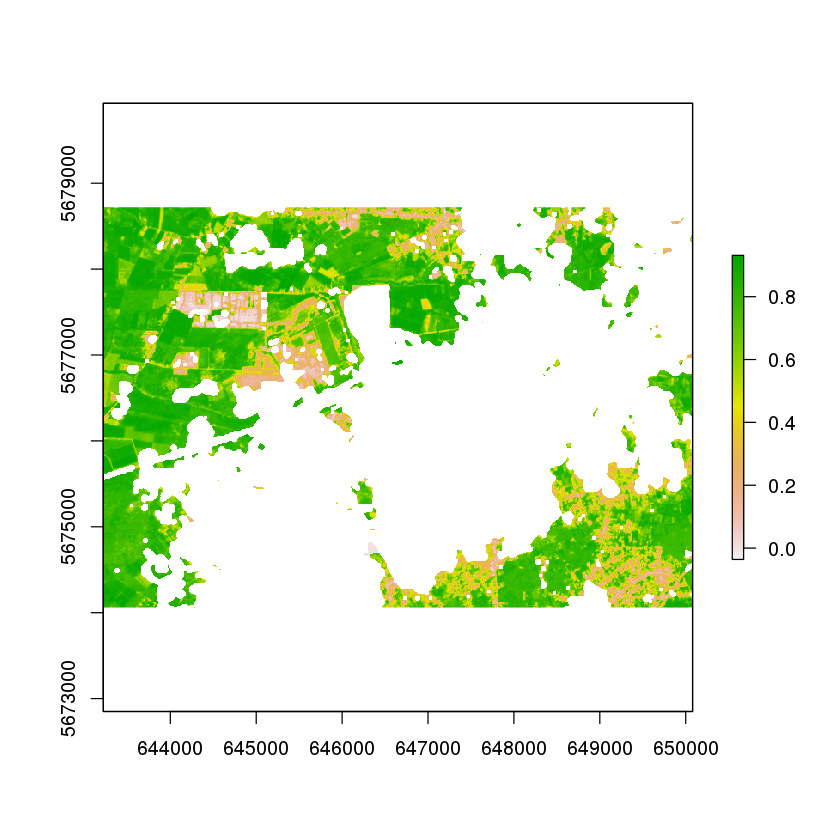

In [44]:
plot(raster(outfile))

## Batch jobs

So far we have downloaded synchronously by waiting for the task to finish, but sometimes jobs are too long to wait. In these common cases, we want to use batch jobs instead.

Let's try to define a longer time and space window.

In [45]:
dates = c("2018-01-01", "2021-03-20")

# Load polygons using a GeoJSON
fields_geojson = '{"type": "GeometryCollection", "geometries": [{"type": "Polygon", "coordinates": [[[5.055945487931457, 51.222709834076504], [5.064972484168688, 51.221122565090525], [5.064972484168688, 51.221122565090525], [5.067474954083448, 51.218249806779134], [5.064827929485983, 51.21689628072789], [5.05917785594747, 51.217191909908095], [5.053553857094518, 51.21807492332223], [5.055945487931457, 51.222709834076504]]]}, {"type": "Polygon", "coordinates": [[[5.063345886679116, 51.23087606640057], [5.06604742694687, 51.22886710731809], [5.070627820472246, 51.22874440121892], [5.068403609708207, 51.22657208381529], [5.064823257492447, 51.22676051738515], [5.064892324615199, 51.2283032878514], [5.063641745941974, 51.2285757299238], [5.062340811262595, 51.227722351687945], [5.06076005158084, 51.228042312276536], [5.063345886679116, 51.23087606640057]]]}, {"type": "Polygon", "coordinates": [[[5.07163184674986, 51.23481147556147], [5.076706025697324, 51.23317590781036], [5.077828303041866, 51.233226237184724], [5.078024733866917, 51.23263978271262], [5.080771081607657, 51.23259097170763], [5.083734842574312, 51.23530464074437], [5.080957826735458, 51.23646091560258], [5.079752631651647, 51.23519531038643], [5.077238400183506, 51.23490534677628], [5.072856439300575, 51.23593546777778], [5.07163184674986, 51.23481147556147]]]}, {"type": "Polygon", "coordinates": [[[5.083897244679042, 51.23510639883143], [5.081302408741335, 51.232922477780846], [5.082963802194108, 51.233146058575876], [5.084497702305552, 51.232672717580655], [5.085732850338428, 51.2340852086282], [5.083897244679042, 51.23510639883143]]]}]}'
fields = st_read(fields_geojson)

Reading layer `OGRGeoJSON' from data source 
  `{"type": "GeometryCollection", "geometries": [{"type": "Polygon", "coordinates": [[[5.055945487931457, 51.222709834076504], [5.064972484168688, 51.221122565090525], [5.064972484168688, 51.221122565090525], [5.067474954083448, 51.218249806779134], [5.064827929485983, 51.21689628072789], [5.05917785594747, 51.217191909908095], [5.053553857094518, 51.21807492332223], [5.055945487931457, 51.222709834076504]]]}, {"type": "Polygon", "coordinates": [[[5.063345886679116, 51.23087606640057], [5.06604742694687, 51.22886710731809], [5.070627820472246, 51.22874440121892], [5.068403609708207, 51.22657208381529], [5.064823257492447, 51.22676051738515], [5.064892324615199, 51.2283032878514], [5.063641745941974, 51.2285757299238], [5.062340811262595, 51.227722351687945], [5.06076005158084, 51.228042312276536], [5.063345886679116, 51.23087606640057]]]}, {"type": "Polygon", "coordinates": [[[5.07163184674986, 51.23481147556147], [5.076706025697324, 51.2331

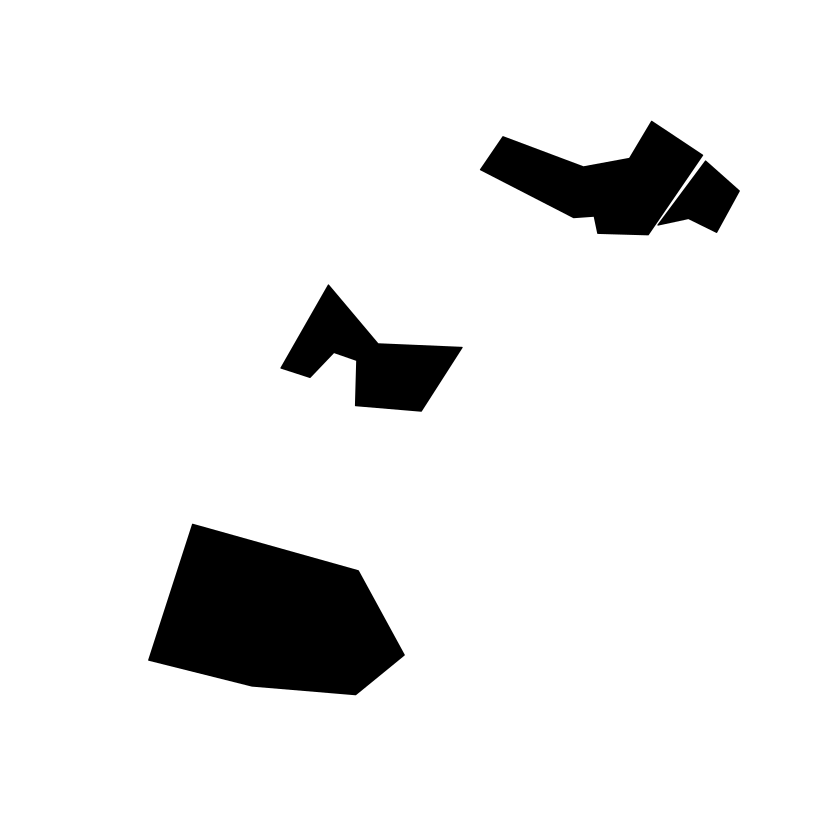

In [46]:
plot(fields)

Let's extract NDVI over these fields from our NDVI data over the time that we defined above. The result is a time series.

In [47]:
bands = c("B04", "B08", "SCL")

cube = p$load_collection("TERRASCOPE_S2_TOC_V2", bands = bands)
cube = p$filter_bbox(bbox, data=cube)
cube
cube = p$filter_temporal(dates, data=cube)

ndvi = p$reduce_dimension(data = cube, dimension = "bands", reducer =
function(data, context) {
  red = data[1]
  nir = data[2]
  ndvi = (nir - red) / (nir + red)
})

classification = p$filter_bands("SCL", data=cube)
mask = p$apply(data = classification, process =
  function(value, context){
      classification = value
      result = p$or((classification == 4), (classification == 5))
  }
)

mask2 = p$apply_kernel(kernel, data=mask)
mask2 = p$reduce_dimension(mask2, function(x, context) x < 0.9, "bands")                           

masked_ndvi = p$mask(ndvi, mask2)

{
  "process_id": "filter_bbox",
  "arguments": {
    "data": {
      "from_node": "load_collection_YITSR9019I"
    },
    "extent": {
      "west": 5.05,
      "south": 51.2,
      "east": 5.15,
      "north": 51.24
    }
  }
} 

In [48]:
# Get zonal statistics
masked_timeseries = p$aggregate_spatial(masked_ndvi, geometries=fields, reducer=function(x, context) mean(x))

In [49]:
# Explicitly state that we want a JSON output (see list_file_formats() for all options, e.g. CSV)
masked_timeseries = p$save_result(masked_timeseries, format="CSV")

Define a job and then start it!

In [50]:
job = create_job(masked_timeseries)

Job was sucessfully registered on the backend.



In [51]:
start_job(job)

Job 'de4e0c91-d919-4769-839a-713864c2030d' has been successfully queued for evaluation.



In [52]:
status(job)

[1] "finished"

In [53]:
describe_job(job) # Gives up-to-date information, also some debugging info for backend developers/support

Job ID:		de4e0c91-d919-4769-839a-713864c2030d
Title:		---
Description:	---
Status:		finished
Created:	2021-07-08T08:53:27Z
Updated:	2021-07-08T08:55:20Z
Plan:		---
Costs:		
Budget:		---
User defined process:
Process:	
Summary:	
Description:	
Returns:	

Stored process graph:
{
  "aggregate_spatial_DVYMY0499L": {
    "arguments": {
      "context": {},
      "data": {
        "from_node": "mask_GJEEQ8256C"
      },
      "geometries": {
        "geometries": [
          {
            "coordinates": [
              [
                [
                  5.0559,
                  51.2227
                ],
                [
                  5.065,
                  51.2211
                ],
                [
                  5.065,
                  51.2211
                ],
                [
                  5.0675,
                  51.2182
                ],
                [
                  5.0648,
                  51.2169
                ],
                [
                  5

In [54]:
list_results(job)

Results for job:  de4e0c91-d919-4769-839a-713864c2030d 

# A tibble: 1 x 5
  asset_name   `file:nodata` href                               roles   title   
  <chr>        <list>        <chr>                              <list>  <chr>   
1 timeseries.~ <list [1]>    https://openeo-dev.vito.be/openeo~ <list ~ timeser~

In [55]:
results = download_results(job, ".")

In [56]:
results

[[1]]
[1] "./timeseries.csv"

In [57]:
# The server may send more than one file as a result (e.g. tiles of different UTM zones)
timeseries_df = read.csv(results[[1]])

In [58]:
timeseries_dates = as.Date(names(timeseries_df), format="X%Y.%m.%dT00.00.00Z")
head(timeseries_dates)

[1] "2020-06-11" "2018-06-25" "2018-11-19" "2018-12-27" "2018-01-13"
[6] "2018-02-12"

As you can see, the time series is not guaranteed to be in order. The backend is free to optimise for its own efficiency.

Let's reorder for nice plotting, and transpose for easier interface (e.g. with ggplot2).

In [59]:
timeseries = t(timeseries_df) # Transpose

In [60]:
timeseries_df = data.frame(timeseries, dates=timeseries_dates) # Combine into a new data.frame

In [61]:
timeseries_df = timeseries_df[order(timeseries_df$dates),]

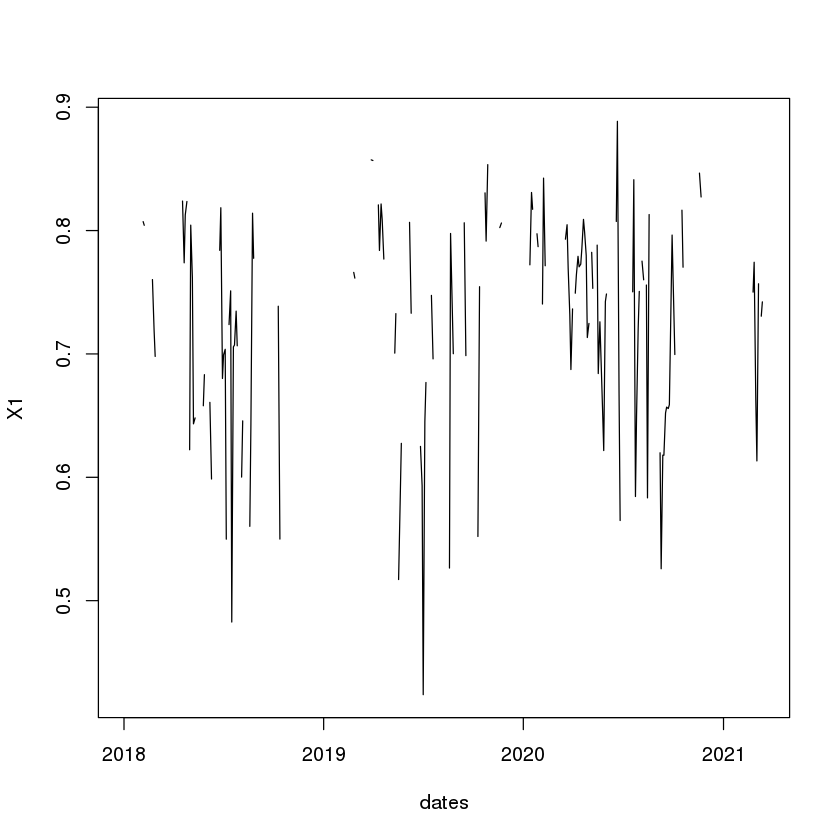

In [62]:
plot(X1~dates, timeseries_df, type="l")

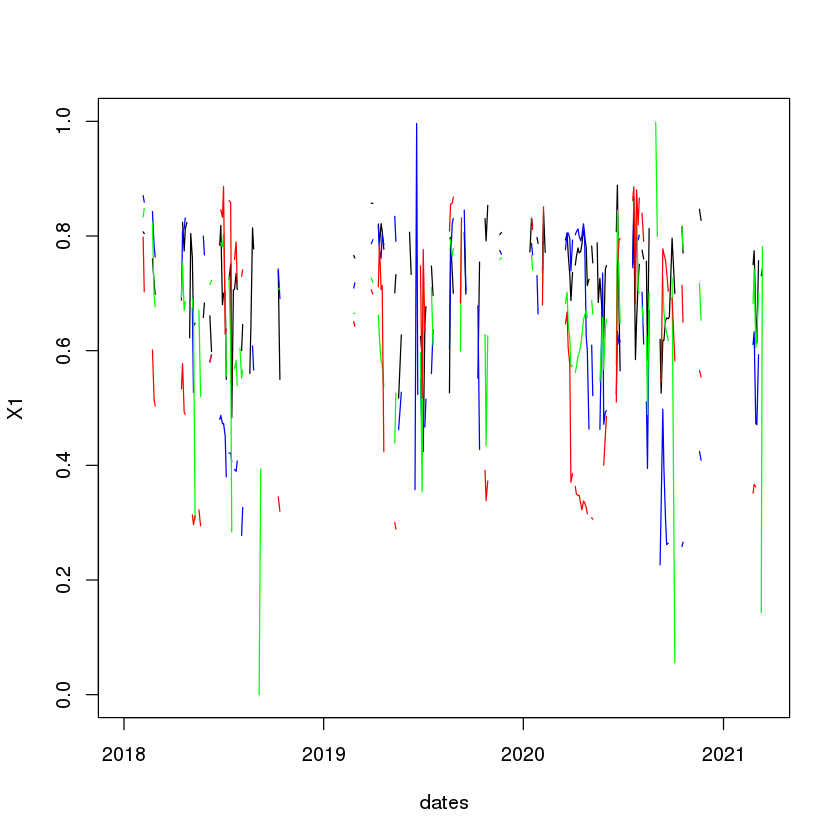

In [63]:
plot(X1~dates, timeseries_df, type="l", ylim=c(0, 1))
lines(X2~dates, timeseries_df, col="blue")
lines(X3~dates, timeseries_df, col="green")
lines(X4~dates, timeseries_df, col="red")

For a more fancy visualisation:

In [64]:
ExtPackages = c("zoo", "plotly", "magrittr")
for (package in ExtPackages) {
    if (!package %in% rownames(installed.packages()))
        install.packages(package)
    library(package, character.only = TRUE)
}


Attaching package: 'zoo'


The following objects are masked from 'package:base':

    as.Date, as.Date.numeric


Installing package into '/home/greatemerald/.rlibs'
(as 'lib' is unspecified)

also installing the dependencies 'later', 'crosstalk', 'data.table', 'promises'


Loading required package: ggplot2


Attaching package: 'plotly'


The following object is masked from 'package:ggplot2':

    last_plot


The following object is masked from 'package:raster':

    select


The following object is masked from 'package:stats':

    filter


The following object is masked from 'package:graphics':

    layout



Attaching package: 'magrittr'


The following object is masked from 'package:raster':

    extract




In [65]:
timeseries_zoo = zoo(timeseries, timeseries_dates)
timeseries_zoo

                                                   
2018-01-01        NA        NA         NA        NA
2018-01-03        NA        NA         NA        NA
2018-01-06        NA        NA         NA        NA
2018-01-08        NA        NA         NA        NA
2018-01-11        NA        NA         NA        NA
2018-01-13        NA        NA         NA        NA
2018-01-16        NA        NA         NA        NA
2018-01-18        NA        NA         NA        NA
2018-01-21 0.6297694 0.6898816 0.71394921 0.6682816
2018-01-23        NA        NA         NA        NA
2018-01-26        NA        NA         NA        NA
2018-01-28        NA        NA         NA        NA
2018-01-31        NA        NA         NA        NA
2018-02-02        NA        NA         NA        NA
2018-02-05 0.8072390 0.8703896 0.83336472 0.7978599
2018-02-07 0.8042916 0.8591238 0.84805016 0.7027708
2018-02-10        NA        NA         NA        NA
2018-02-12        NA        NA         NA        NA
2018-02-15  

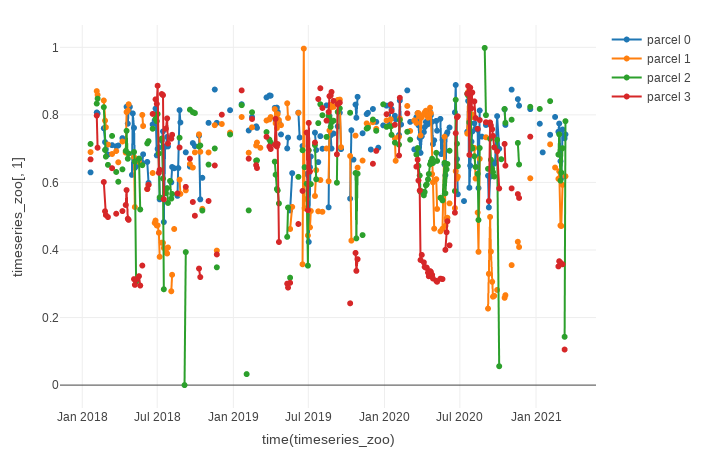

In [66]:
plot_ly(x = ~time(timeseries_zoo), y = ~timeseries_zoo[,1], name="parcel 0", type="scatter", mode = "lines+markers") %>%
  add_trace(y = ~timeseries_zoo[,2], name = "parcel 1") %>%
  add_trace(y = ~timeseries_zoo[,3], name = "parcel 2") %>%
  add_trace(y = ~timeseries_zoo[,4], name = "parcel 3")

R does not interpolate values where there are none. But we can do that manually to get a smoother plot:

In [67]:
timeseries_zoo = na.approx(timeseries_zoo)

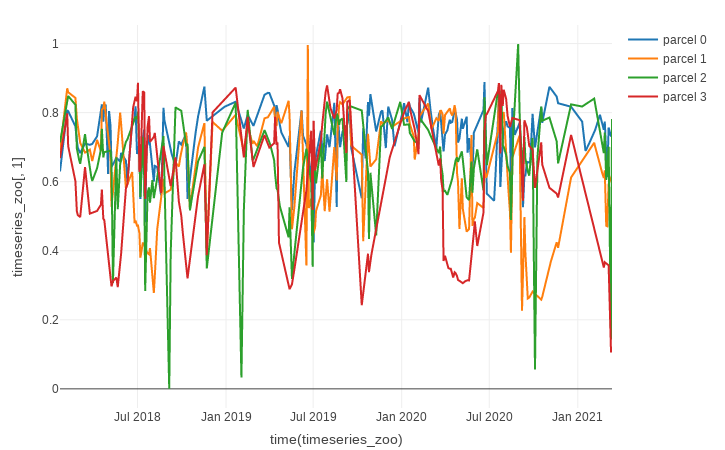

In [68]:
plot_ly(x = ~time(timeseries_zoo), y = ~timeseries_zoo[,1], name="parcel 0", type="scatter", mode = "lines") %>%
  add_trace(y = ~timeseries_zoo[,2], name = "parcel 1") %>%
  add_trace(y = ~timeseries_zoo[,3], name = "parcel 2") %>%
  add_trace(y = ~timeseries_zoo[,4], name = "parcel 3")